In [1]:
import glob
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
filepaths = glob.glob("..\\raw_data\\**\\*.jpg", recursive=True)

In [3]:
df = pd.DataFrame(filepaths, columns=["img_id"])
df["img_id"] = df["img_id"].apply(lambda x: x.replace("..\\raw_data\\", ""))
df["plant"] = df["img_id"].apply(lambda x: x.split("\\")[0])
df["condition"] = df["img_id"].apply(lambda x: x.split("\\")[1])
df["plant_condition"] = df["plant"] + "_" + df["condition"]

In [4]:
sorted(df["plant"].unique())

['apple',
 'bell_pepper',
 'blueberry',
 'cherry',
 'citrus',
 'coffee',
 'corn',
 'grape',
 'guava',
 'mango',
 'peach',
 'pomegranate',
 'potato',
 'raspberry',
 'rice',
 'soybean',
 'squash',
 'strawberry',
 'tea',
 'tomato']

In [5]:
sorted(df["condition"].unique())

['bacterial_spot',
 'black_measles',
 'black_mold',
 'black_rot',
 'black_spot',
 'blast',
 'blight',
 'brown_spot',
 'canker',
 'diseased',
 'dot',
 'early_blight',
 'gray_spot',
 'greening',
 'healthy',
 'late_blight',
 'leaf_mold',
 'leaf_scorch',
 'melanose',
 'miner',
 'mosaic_virus',
 'mummification',
 'powdery_mildew',
 'rust',
 'scab',
 'scald',
 'septoria_leaf_spot',
 'spot',
 'target_spot',
 'tungro',
 'two_spotted_spider_mite',
 'virus',
 'yellow_leaf_curl_virus']

<AxesSubplot:xlabel='plant', ylabel='Count'>

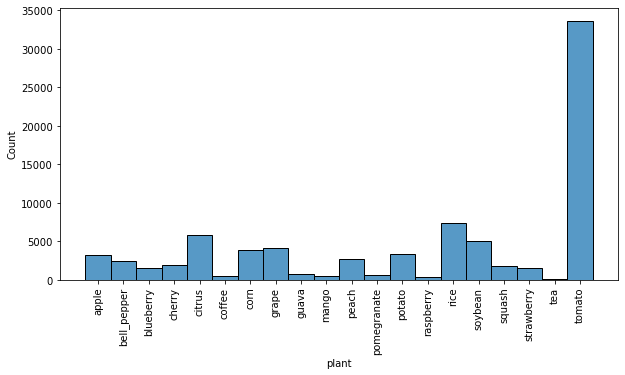

In [6]:
plt.figure(figsize=(10, 5))
plt.xticks(rotation=90)
sns.histplot(df["plant"])

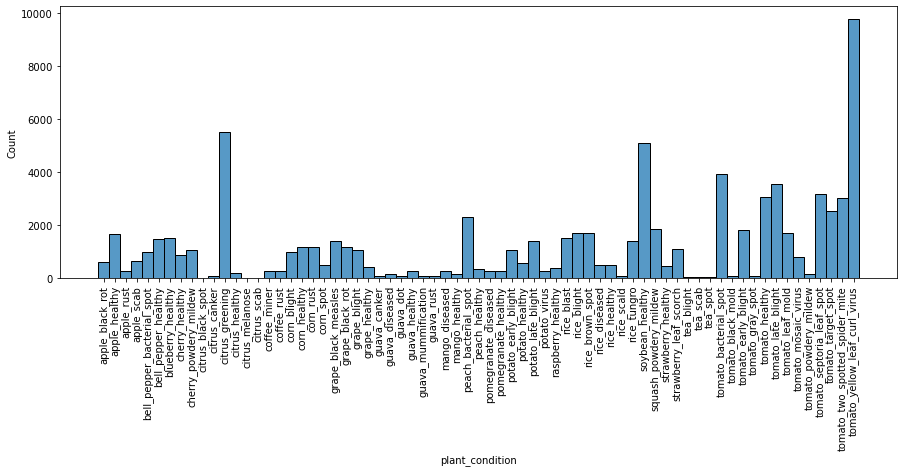

In [7]:
plt.figure(figsize=(15, 5))
plt.xticks(rotation=90)
g = sns.histplot(df["plant_condition"])

In [8]:
# Source: https://jdhao.github.io/2017/11/06/resize-image-to-square-with-padding/
def pad_resize(img, desired_size=256):
    old_size = img.shape[:2]
    ratio = float(desired_size) / max(old_size)
    new_size = tuple([int(x * ratio) for x in old_size])

    temp = cv2.resize(img, (new_size[1], new_size[0]))

    delta_w = desired_size - new_size[1]
    delta_h = desired_size - new_size[0]

    top, bottom = delta_h // 2, delta_h - delta_h // 2
    left, right = delta_w // 2, delta_w - delta_w // 2

    new_img = cv2.copyMakeBorder(temp, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0, 0, 0])
    
    return new_img

apple_black_rot


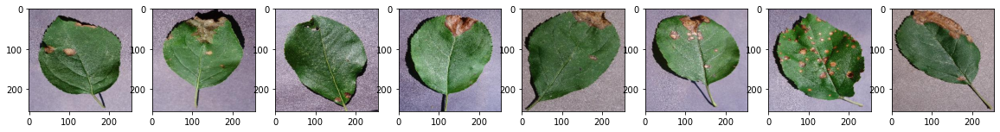

apple_healthy


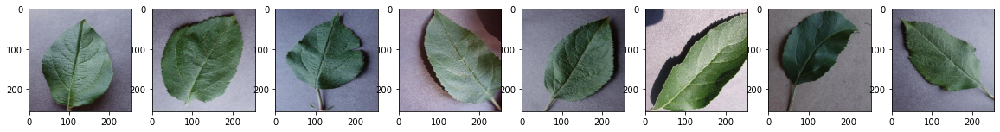

apple_rust


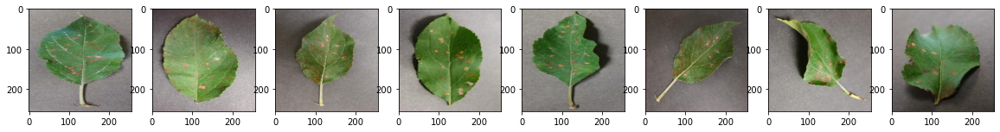

apple_scab


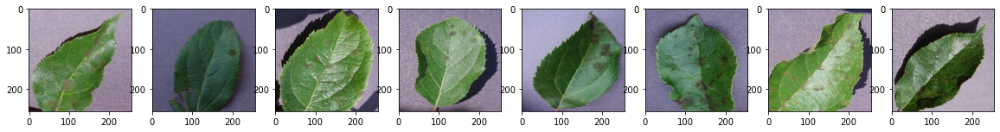

bell_pepper_bacterial_spot


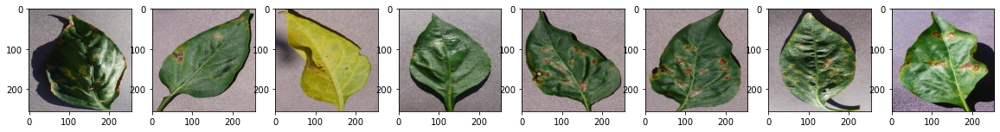

bell_pepper_healthy


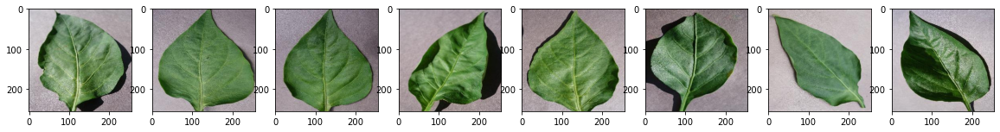

blueberry_healthy


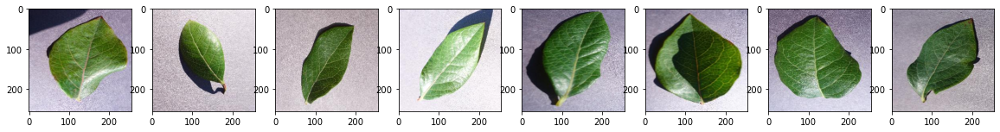

cherry_healthy


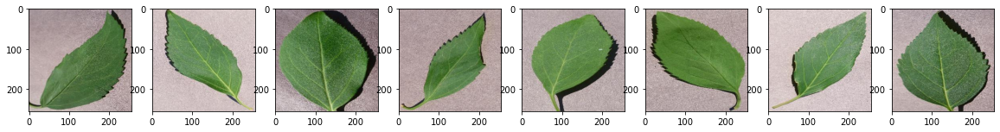

cherry_powdery_mildew


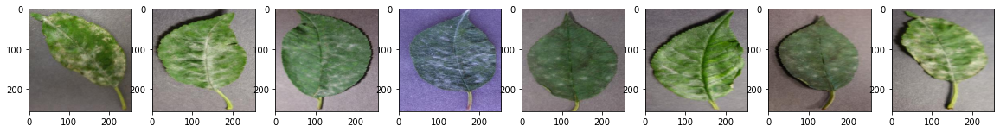

citrus_black_spot


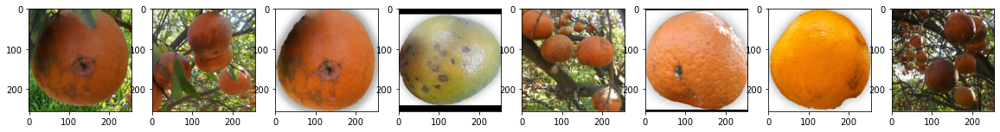

citrus_canker


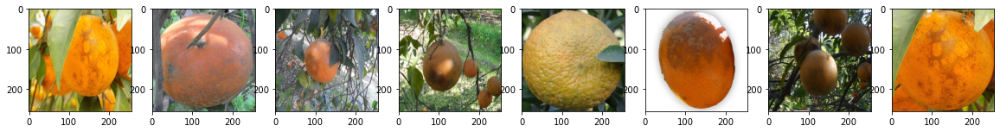

citrus_greening


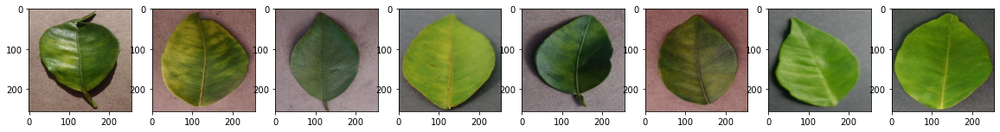

citrus_healthy


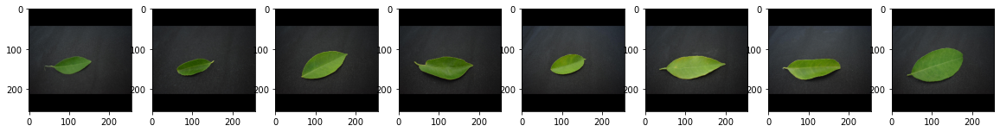

citrus_melanose


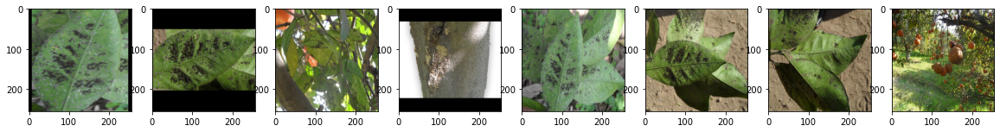

citrus_scab


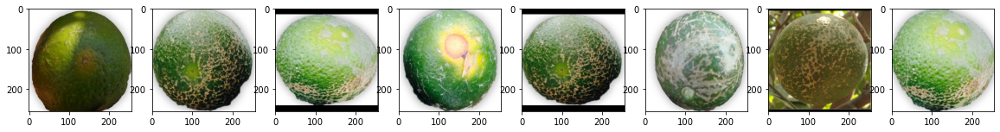

coffee_miner


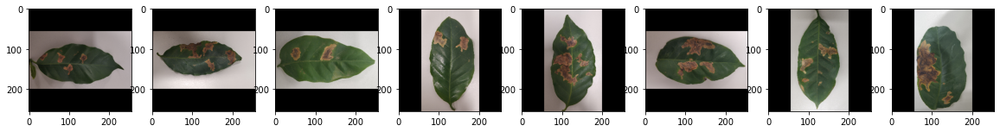

coffee_rust


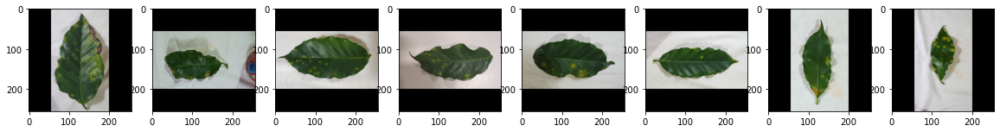

corn_blight


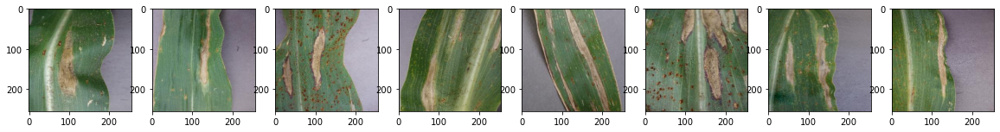

corn_healthy


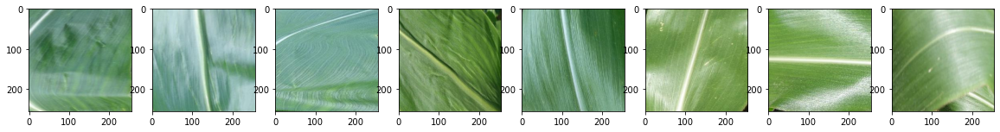

corn_rust


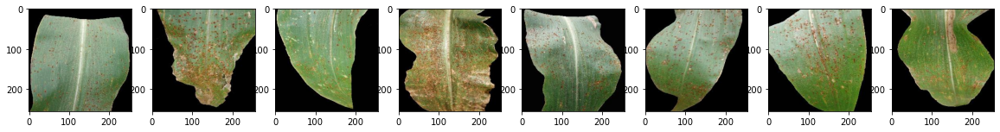

corn_spot


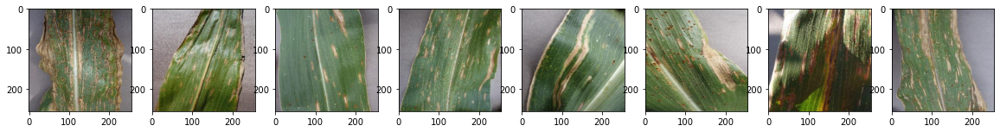

grape_black_measles


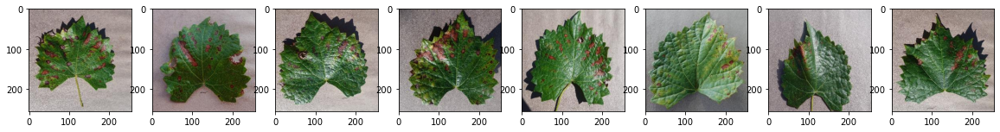

grape_black_rot


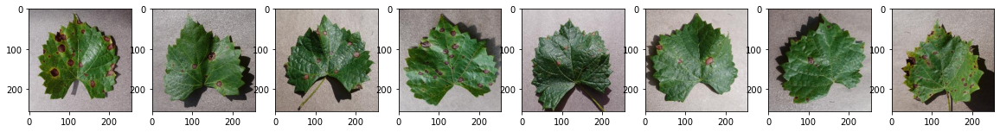

grape_blight


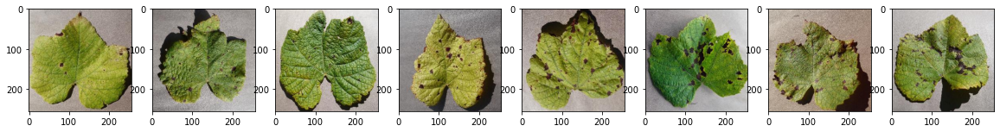

grape_healthy


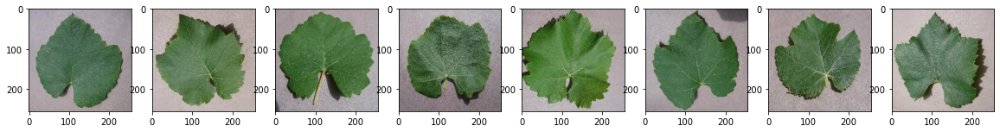

guava_canker


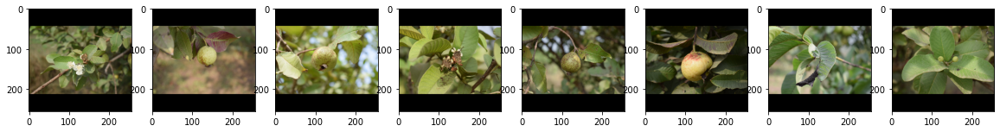

guava_diseased


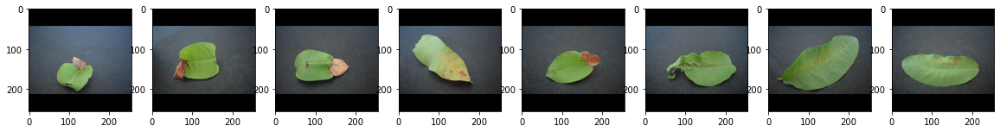

guava_dot


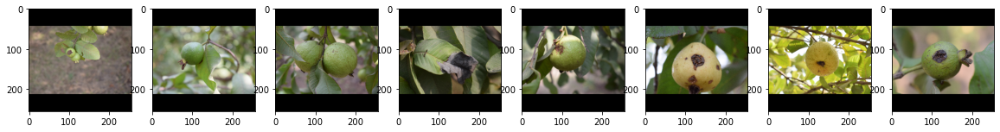

guava_healthy


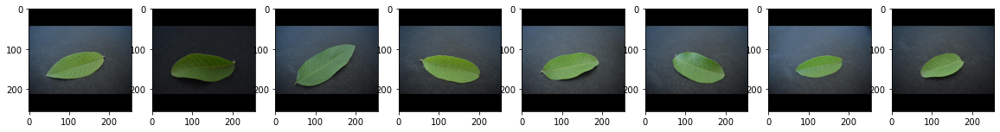

guava_mummification


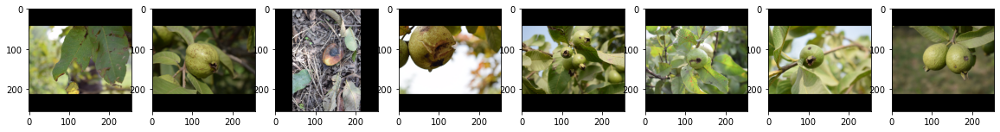

guava_rust


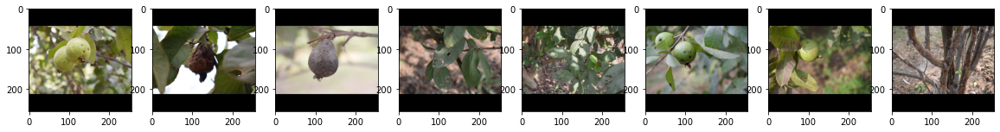

mango_diseased


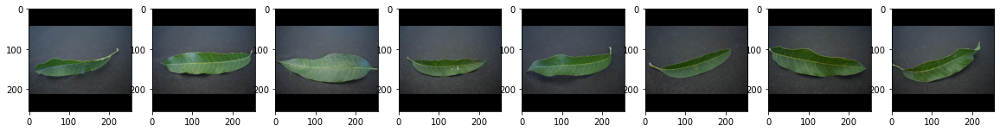

mango_healthy


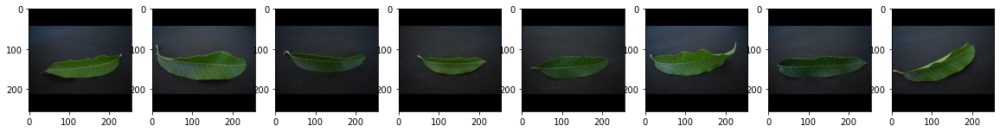

peach_bacterial_spot


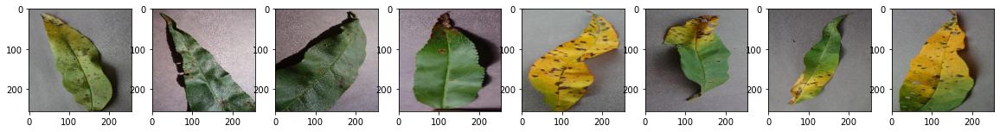

peach_healthy


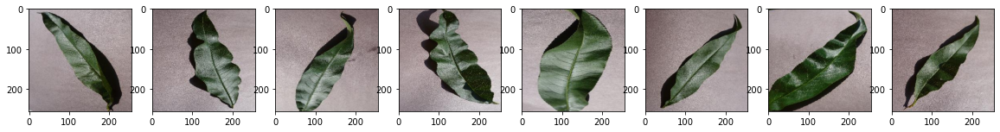

pomegranate_diseased


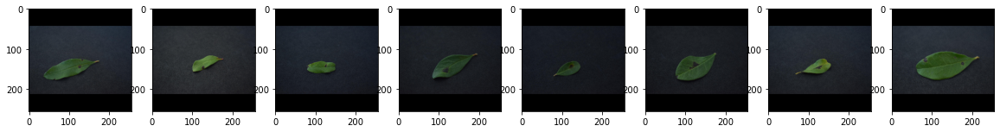

pomegranate_healthy


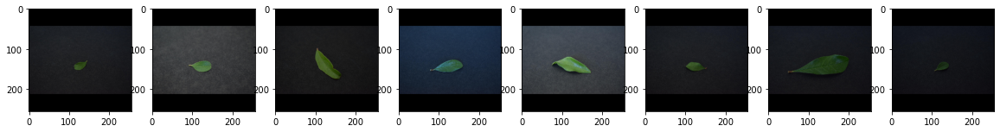

potato_early_blight


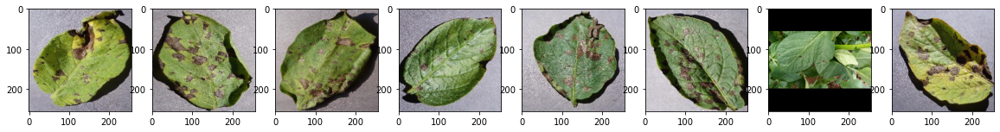

potato_healthy


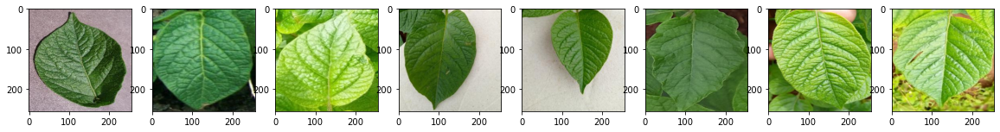

potato_late_blight


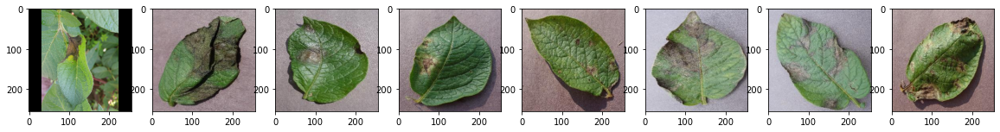

potato_virus


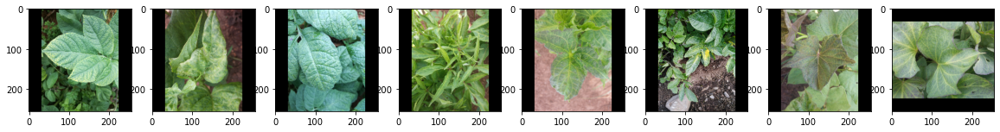

raspberry_healthy


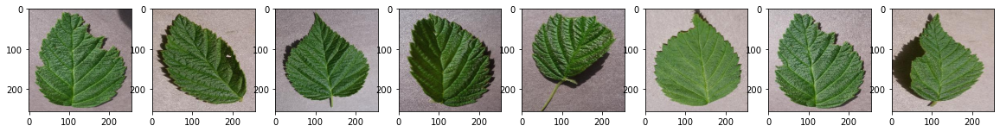

rice_blast


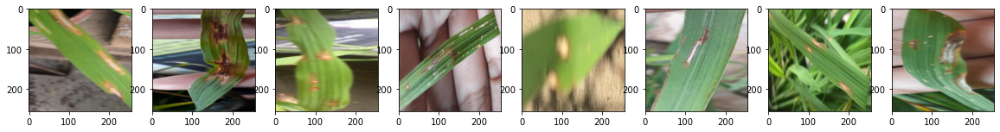

rice_blight


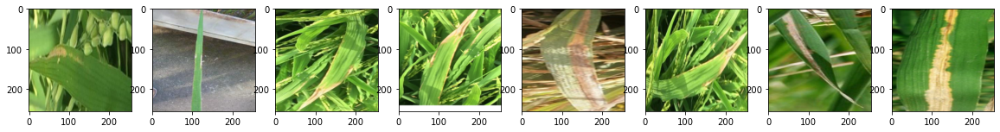

rice_brown_spot


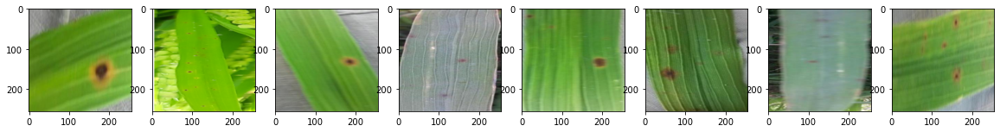

rice_diseased


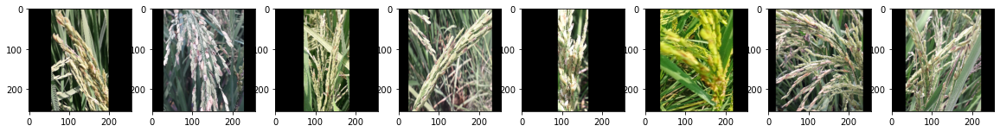

rice_healthy


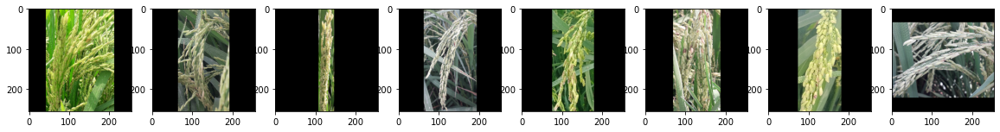

rice_scald


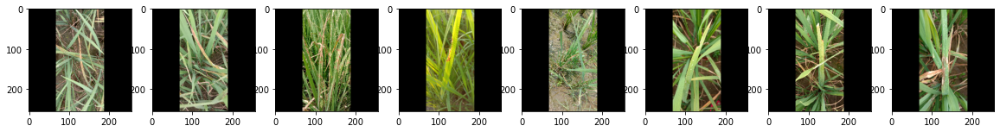

rice_tungro


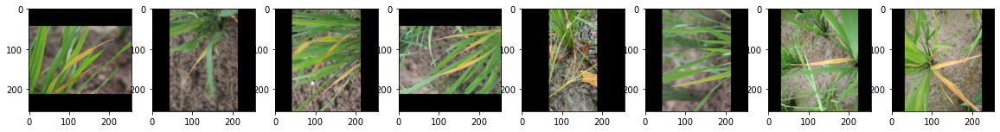

soybean_healthy


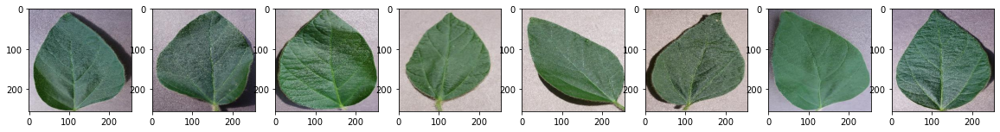

squash_powdery_mildew


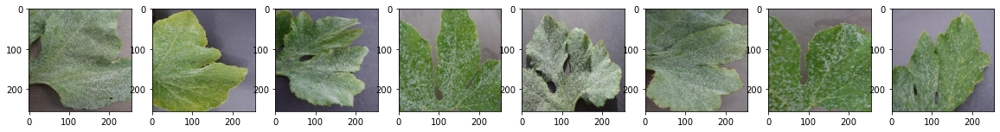

strawberry_healthy


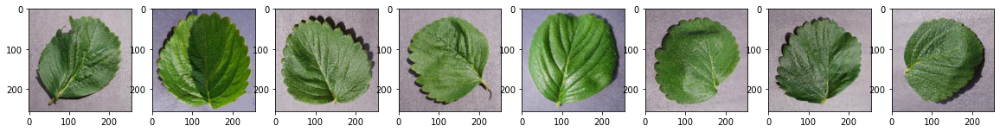

strawberry_leaf_scorch


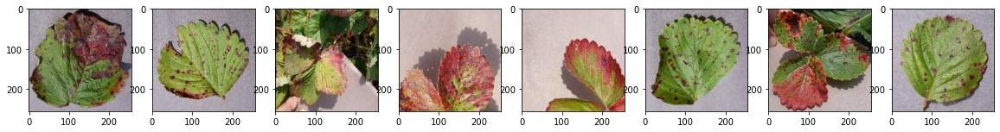

tea_blight


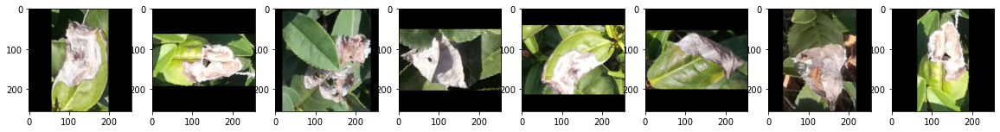

tea_scab


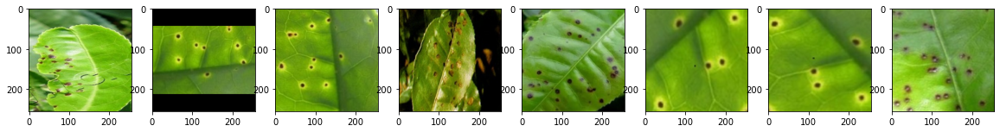

tea_spot


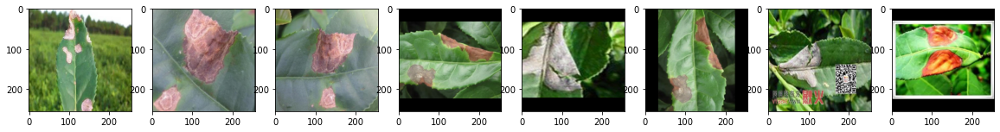

tomato_bacterial_spot


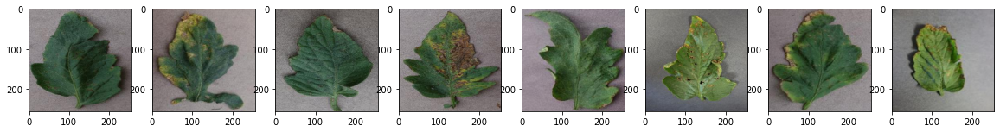

tomato_black_mold


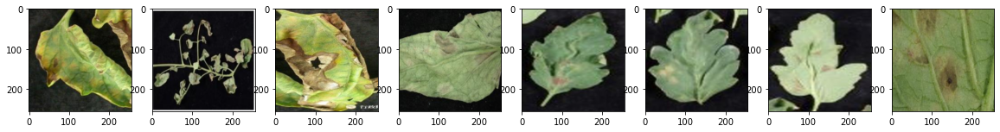

tomato_early_blight


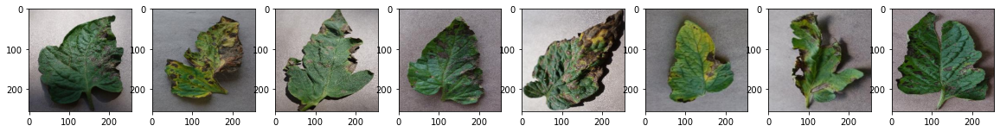

tomato_gray_spot


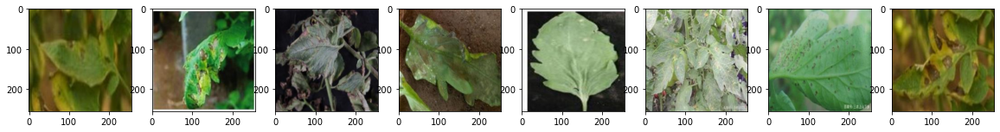

tomato_healthy


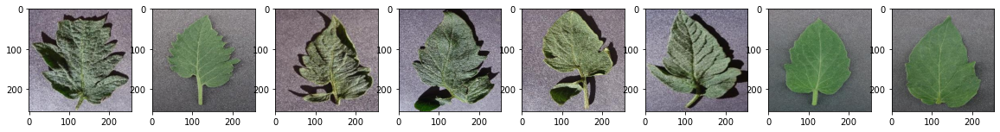

tomato_late_blight


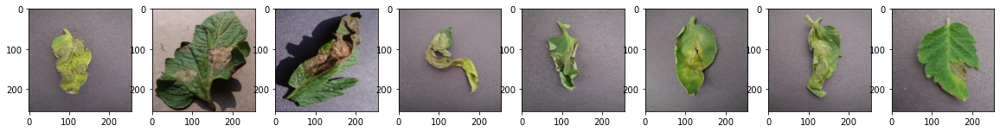

tomato_leaf_mold


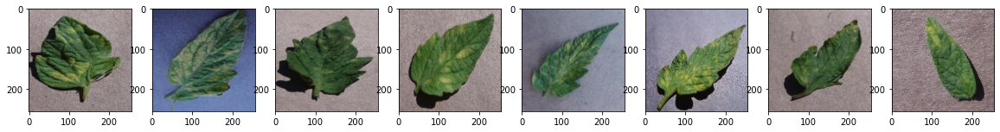

tomato_mosaic_virus


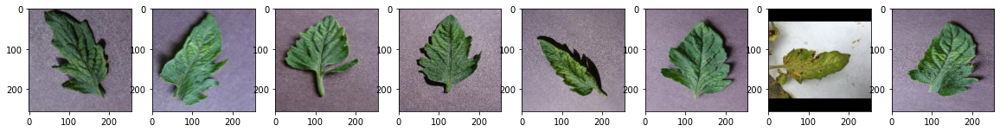

tomato_powdery_mildew


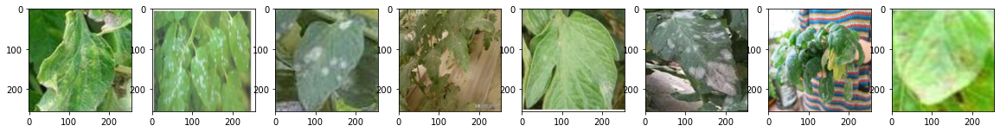

tomato_septoria_leaf_spot


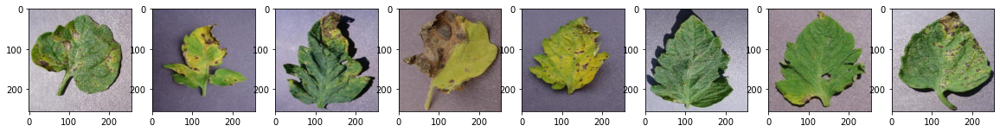

tomato_target_spot


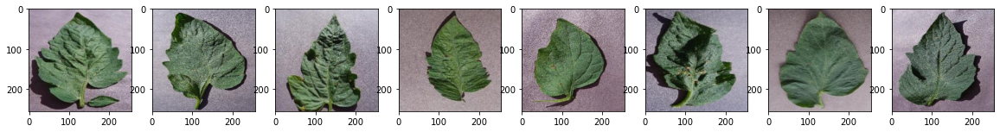

tomato_two_spotted_spider_mite


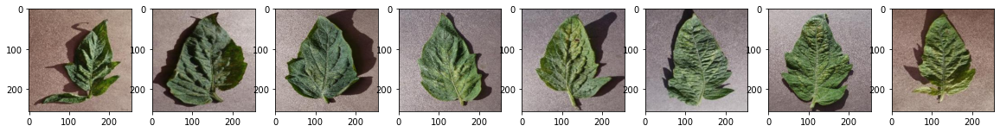

tomato_yellow_leaf_curl_virus


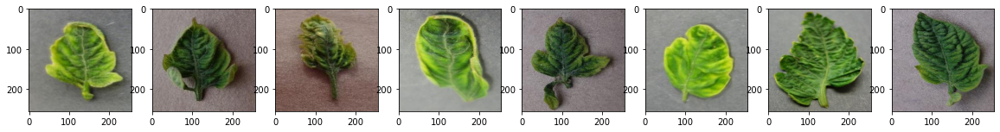

In [9]:
for plant_condition in sorted(df["plant_condition"].unique()):
    print(plant_condition)
    plt.figure(figsize=(20, 10))
    for i, (_, row) in enumerate(df[df["plant_condition"] == plant_condition].sample(8).iterrows()):
        img = cv2.imread("..\\raw_data\\" + row["img_id"])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = pad_resize(img)
        plt.subplot(1, 8, i + 1), plt.imshow(img)
    plt.show()